# Unsupervised Clustering

In [ ]:
%matplotlib inline

import time
import os, os.path
import random
import cv2
import glob
import keras
import matplotlib
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import shutil
import pandas as pd
import numpy as np

## Dataset information

In [2]:
image_folder = '/home/pixelserver/Desktop/work_mdcu/cropped_images/'
anno_file = '/home/pixelserver/Desktop/work_mdcu/annotations_filter.csv'
output_path = '/home/pixelserver/Desktop/work_mdcu/anno_cluster/'
output2_path = '/home/pixelserver/Desktop/work_mdcu/unanno_cluster/'

In [3]:
df = pd.read_csv(anno_file,header=None)
df.head()

,0,1
0,10-3840931-580710-cyst&fatty_11_10.jpg,0
1,10-3840931-580710-cyst&fatty_15_14.jpg,0
2,10-3840931-580710-cyst&fatty_4_3.jpg,0
3,10-3840931-580710-cyst&fatty_5_4.jpg,0
4,100-1156555-170824-fatty&cholecystectomy&commo...,0


In [4]:
def preprocess_img(full_filename):
    img = cv2.imread(full_filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img/255.
    return img

In [5]:
########################################################################
anno_dict = dict()

for i in range(len(df)):
    anno_dict[df[0][i]] = df[1][i]

########################################################################    
    
total_file = 0
labeled_count = 0
unlabeled_count =0

labeled_list = [] # Keep only file name
unlabeled_list = [] # Keep only file name

train_data = [] # Keep the raw data eg. [data0, data1, data2, data3]

test_data = [] # Keep the raw data eg. [data0, data1, data2, data3]
test_anno = [] # Keep the annotation eg. [0, 1, 3, 88]

#########################################################################

for root, dirs, files in os.walk(image_folder):
    for filename in files:
        if filename.endswith(".jpg"):
            full_filename = os.path.join(root, filename)
            if filename in anno_dict.keys():
                labeled_count +=1
                labeled_list.append(filename)
                #test_data.append(preprocess_img(full_filename))
                #test_anno.append(anno_dict[filename])
                #if not os.path.isdir(output_path+str(anno_dict[filename])):
                    #os.mkdir(output_path+str(anno_dict[filename]))
                #shutil.copyfile(full_filename, output_path+str(anno_dict[filename])+"/"+filename)
            else:
                unlabeled_count +=1
                unlabeled_list.append(filename)
                #shutil.copyfile(full_filename, output2_path+filename)
                #train_data.append(preprocess_img(full_filename))
            total_file +=1

In [6]:
print("Total file = %s \nLabeled_count = %s \nUnlabeled_count = %s \nanno_file = %s" %(total_file, labeled_count, unlabeled_count, len(df)))

Total file = 26978 
Labeled_count = 23180 
Unlabeled_count = 3798 
anno_file = 23329


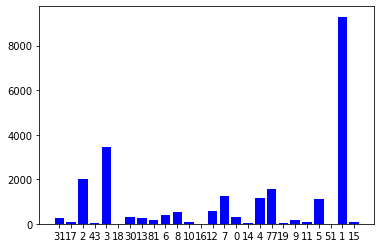

In [7]:
anno_cluster = dict()

for root, dirs, files in os.walk(output_path):
    for filename in files:
        if filename.endswith(".jpg"):
            full_filename = os.path.join(root, filename)
            cluster = full_filename.split("/")[-2]
            if not cluster in anno_cluster.keys():
                anno_cluster[str(cluster)] = 1
            else:
                anno_cluster[str(cluster)] += 1 

plt.bar(list(anno_cluster.keys()), anno_cluster.values(), color='b')
plt.show()

In [8]:
# directory where images are stored
DIR = "./usg_kmean_all"

def dataset_stats():
    
    # This is an array with the letters available.
    # If you add another animal later, you will need to structure its images in the same way
    # and add its letter to this array
    animal_characters = ['A0','B1', 'C2', 'D3', 'E4', 'F5', 'G6', 'H7', 'I8', 'J9', 'K10', 'L11', 'M12', 'N13', 'O14', 'P15', 'Q16', 'R17', 'S18', 'T19', 'U30', 'V31', 'W43', 'X51', 'Y77', 'Z81']
    
    # dictionary where we will store the stats
    stats = []
    
    for animal in animal_characters:
        # get a list of subdirectories that start with this character
        directory_list = sorted(glob.glob("{}/[{}]*".format(DIR, animal)))
        
        for sub_directory in directory_list:
            file_names = [file for file in os.listdir(sub_directory)]
            file_count = len(file_names)
            sub_directory_name = os.path.basename(sub_directory)
            stats.append({ "Code": sub_directory_name[0],
                            "Image count": file_count, 
                           "Folder name": os.path.basename(sub_directory),
                            "File names": file_names})
    
    
    df = pd.DataFrame(stats)
    
    return df

In [9]:
# Show codes with their folder names and image counts
dataset = dataset_stats().set_index("Code")
dataset[["Folder name", "Image count"]]

,Folder name,Image count
Code,,
A,A0-A,296
B,B1-B,9297
C,C2-C,1989
D,D3-D,3464
E,E4-E,1144
F,F5-F,1095
G,G6-G,414
H,H7-H,1232
I,I8-I,520


### Loading the images

In [10]:
# Function returns an array of images whoose filenames start with a given set of characters
# after resizing them to 224 x 224

def load_images(codes):
    
    # Define empty arrays where we will store our images and labels
    images = []
    labels = []
    
    for code in codes:
        # get the folder name for this code
        folder_name = dataset.loc[code]["Folder name"]
        
        for file in dataset.loc[code]["File names"]:                 
            # build file path
            try:
                file_path = os.path.join(DIR, folder_name, file)

                # Read the image
                image = cv2.imread(file_path)

                # Resize it to 224 x 224
                image = cv2.resize(image, (224,224))

                # Convert it from BGR to RGB so we can plot them later (because openCV reads images as BGR)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # Now we add it to our array
                images.append(image)
                labels.append(code)
            except Exception as e:
                print(file)

    return images, labels

#### Now we chose our codes for the breeds that we want and load the images and labels

In [11]:
codes = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']
images, labels = load_images(codes)

### Photo time!

In [12]:
def show_random_images(images, labels, number_of_images_to_show=3):

    for code in list(set(labels)):

        indicies = [i for i, label in enumerate(labels) if label == code]
        random_indicies = [random.choice(indicies) for i in range(number_of_images_to_show)]
        print(random_indicies)
        figure, axis = plt.subplots(1, number_of_images_to_show, figsize=(30,30))

        print("{} random images for code {}".format(number_of_images_to_show, code))

        for image in range(number_of_images_to_show):
            axis[image].imshow(images[random_indicies[image]])
        plt.show()

### Normalise...

In [13]:
def normalise_images(images, labels):

    # Convert to numpy arrays
    images = np.array(images, dtype=np.float32)
    labels = np.array(labels)

    # Normalise the images
    images /= 255.
    
    return images, labels

In [14]:
images, labels = normalise_images(images, labels)

### Train_test_split

In [15]:
def shuffle_data(images, labels):

    # Set aside the testing data. We won't touch these until the very end.
    X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=1, random_state=728)
    
    return X_train, y_train

In [16]:
X_train, y_train = shuffle_data(images, labels)

In [17]:
y_train_idx = np.array([codes.index(d) for d in y_train])

In [18]:
images.shape

(23180, 224, 224, 3)

In [19]:
X_train.shape

(23179, 224, 224, 3)

In [21]:
X_train_flat = X_train.reshape((23179,-1))

## PCA

In [20]:
def create_fit_PCA(data, n_components=800):
    
    p = PCA(n_components=n_components, random_state=728)
    p.fit(data)
    
    return p

In [22]:
vgg16_pca = create_fit_PCA(X_train_flat)

In [23]:
# Function to plot the cumulative explained variance of PCA components
# This will help us decide how many components we should reduce our features to
def pca_cumsum_plot(pca):
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance')
    plt.show()

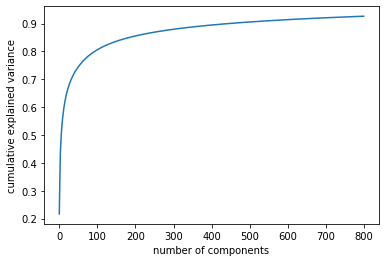

In [24]:
pca_cumsum_plot(vgg16_pca)

In [25]:
# PCA transformations of covnet outputs
vgg16_output_pca = vgg16_pca.transform(X_train_flat)

In [26]:
vgg16_output_pca.shape

(23179, 800)

## PCA-visualuze

In [27]:
vgg16_pca_viz = create_fit_PCA(vgg16_output_pca, n_components=2)

In [28]:
vgg16_output_pca_viz = vgg16_pca_viz.transform(vgg16_output_pca)

In [29]:
vgg16_output_pca_viz.shape

(23179, 2)

## K-mean time

In [30]:
def create_train_kmeans(data, number_of_clusters=len(codes)):
    # n_jobs is set to -1 to use all available CPU cores. This makes a big difference on an 8-core CPU
    # especially when the data size gets much bigger. #perfMatters
    
    k = KMeans(n_clusters=number_of_clusters, n_jobs=-1, random_state=728)

    # Let's do some timings to see how long it takes to train.
    start = time.time()

    # Train it up
    k.fit(data)

    # Stop the timing 
    end = time.time()

    # And see how long that took
    print("Training took {} seconds".format(end-start))
    
    return k

## K=3

K=3
Training took 6.293531894683838 seconds
[19109, 15462, 19279, 11583, 2996, 3979, 10575, 9928, 5534, 20857, 15776, 14404, 10707, 22816]
14 random images for code 0


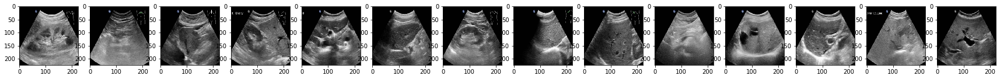

[13032, 4145, 10083, 13264, 135, 14549, 9101, 20263, 22632, 1601, 21700, 20637, 6007, 15836]
14 random images for code 1


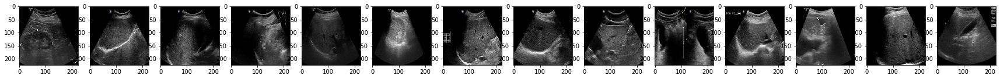

[8706, 22262, 12593, 4424, 9285, 8938, 6615, 115, 18000, 18486, 3347, 20276, 1596, 15300]
14 random images for code 2


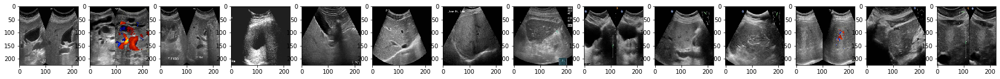

In [31]:
print("K=3")
K_vgg16_pca_3 = create_train_kmeans(vgg16_output_pca, number_of_clusters=3)
k_vgg16_pred_pca_3 = K_vgg16_pca_3.predict(vgg16_output_pca)
show_random_images(X_train, k_vgg16_pred_pca_3, number_of_images_to_show=14)

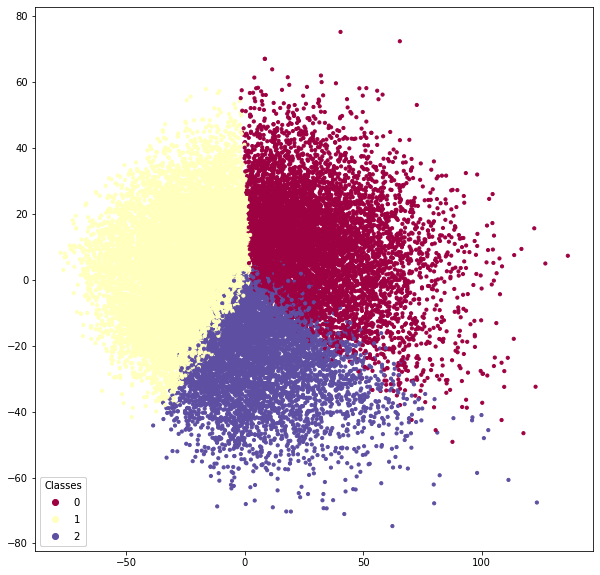

In [32]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_3, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{1: 10364, 0: 7363, 2: 5452}


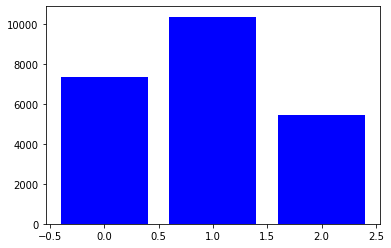

In [33]:
count_cluster = dict()

for i in k_vgg16_pred_pca_3:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster)  

plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()

## K=5

K=5
Training took 5.767550945281982 seconds
[18557, 4358, 12723, 22525, 6858, 20591, 15838, 15004, 3146, 2360, 15422, 8253, 16788, 506]
14 random images for code 0


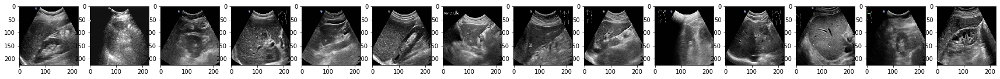

[4547, 20628, 20494, 14884, 12819, 21151, 9587, 13085, 14792, 8996, 1553, 4567, 22337, 11573]
14 random images for code 1


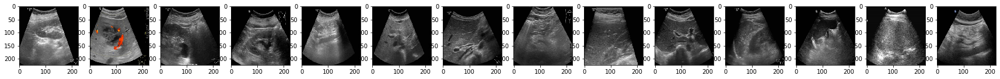

[12611, 5903, 19167, 12389, 20997, 23161, 4327, 21481, 20268, 20726, 14371, 6632, 21481, 18862]
14 random images for code 2


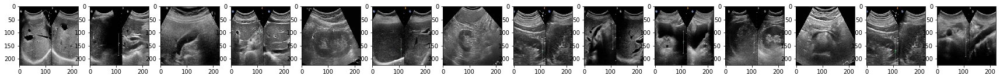

[20443, 15044, 14606, 10880, 6525, 1694, 6704, 10843, 6924, 9639, 20766, 5572, 2720, 6019]
14 random images for code 3


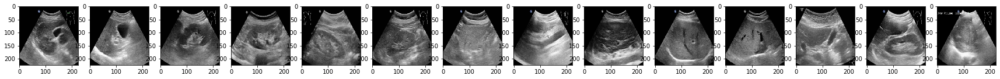

[10106, 14114, 1903, 13265, 14654, 17975, 2248, 11423, 46, 9980, 17639, 650, 9692, 17508]
14 random images for code 4


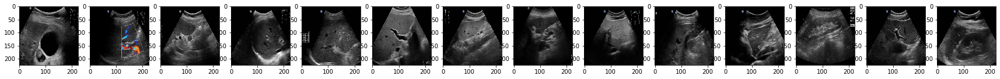

In [34]:
print("K=5")
K_vgg16_pca_5 = create_train_kmeans(vgg16_output_pca, number_of_clusters=5)
k_vgg16_pred_pca_5 = K_vgg16_pca_5.predict(vgg16_output_pca)
show_random_images(X_train, k_vgg16_pred_pca_5, number_of_images_to_show=14)

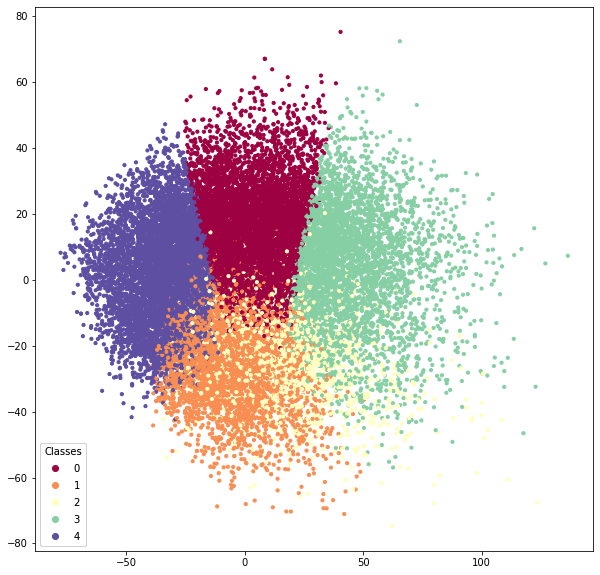

In [35]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_5, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{0: 7065, 4: 6209, 2: 1947, 3: 4059, 1: 3899}


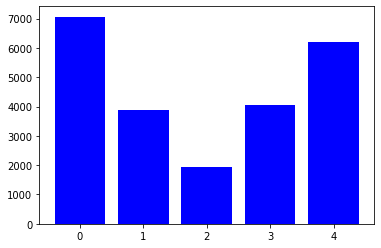

In [36]:
count_cluster = dict()

for i in k_vgg16_pred_pca_5:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster)  
plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()

## K=6

K=6
Training took 6.638897180557251 seconds
[3648, 9443, 14611, 12691, 18935, 7362, 11432, 11484, 12003, 185, 19893, 9789, 18344, 7458]
14 random images for code 0


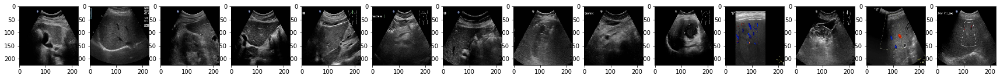

[8207, 1504, 21536, 7116, 16368, 873, 22819, 724, 16987, 11613, 18804, 5291, 20240, 22994]
14 random images for code 1


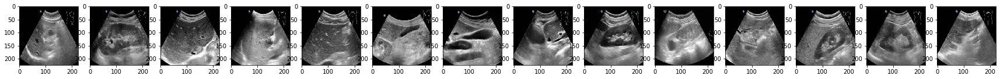

[3459, 21166, 5202, 6726, 12069, 18050, 1179, 1238, 5322, 4502, 17026, 5707, 2569, 10080]
14 random images for code 2


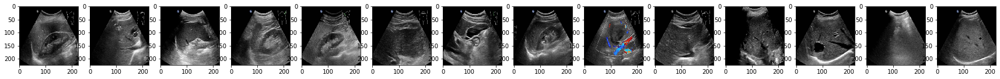

[13295, 3167, 14331, 5954, 11039, 18547, 20515, 14880, 19074, 14330, 8757, 15415, 20245, 8718]
14 random images for code 3


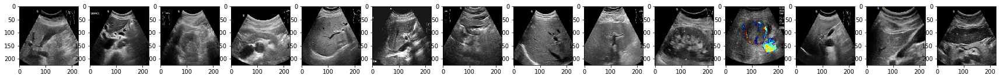

[11164, 15653, 6701, 3278, 1152, 8636, 492, 4718, 16716, 20228, 3441, 19170, 13796, 1905]
14 random images for code 4


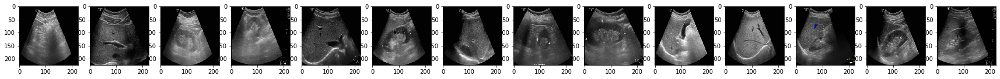

[3542, 8808, 117, 19324, 20582, 22025, 16854, 6026, 19523, 2923, 11706, 78, 21837, 16792]
14 random images for code 5


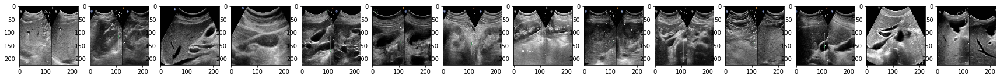

In [37]:
print("K=6")
K_vgg16_pca_6 = create_train_kmeans(vgg16_output_pca, number_of_clusters=6)
k_vgg16_pred_pca_6 = K_vgg16_pca_6.predict(vgg16_output_pca)
show_random_images(X_train, k_vgg16_pred_pca_6, number_of_images_to_show=14)

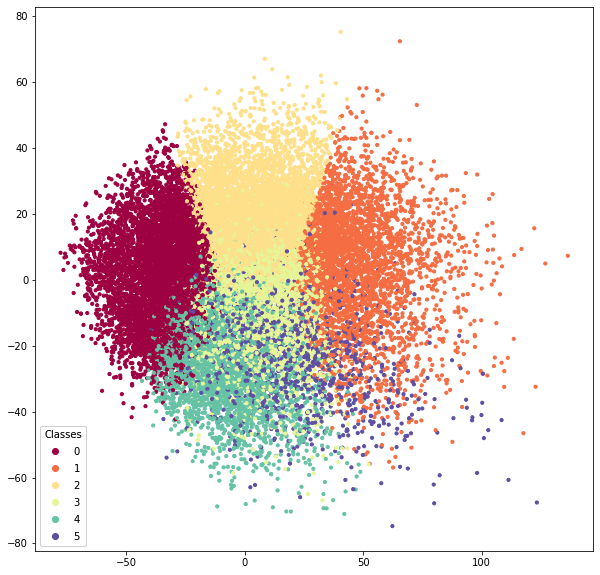

In [38]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_6, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{3: 3885, 0: 5874, 2: 5080, 5: 1635, 1: 3506, 4: 3199}


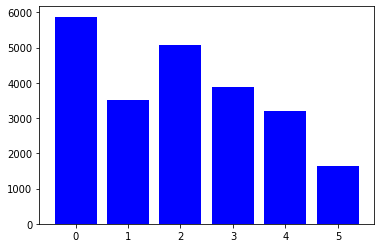

In [39]:
count_cluster = dict()

for i in k_vgg16_pred_pca_6:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster)  
plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()

## K=10

K=10
Training took 11.584647417068481 seconds
[3526, 6447, 18302, 22728, 13237, 15619, 10055, 16655, 19821, 17353, 14669, 20078, 19458, 14422]
14 random images for code 0


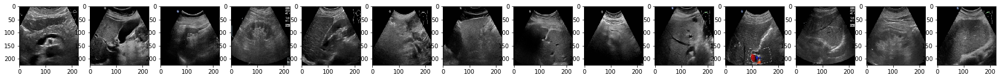

[12293, 6326, 17261, 7648, 395, 6650, 14697, 21560, 14202, 5548, 8451, 4357, 892, 9109]
14 random images for code 1


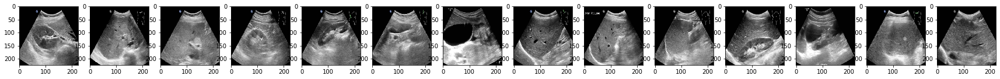

[12593, 5879, 13173, 22940, 12171, 21182, 14581, 21433, 14988, 6163, 10858, 14160, 6860, 21830]
14 random images for code 2


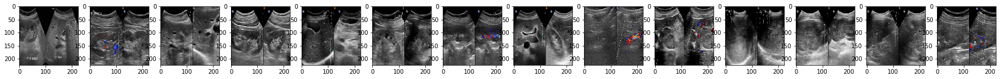

[11344, 19266, 9987, 22936, 21694, 16097, 18031, 5352, 288, 13023, 1354, 17957, 10865, 15627]
14 random images for code 3


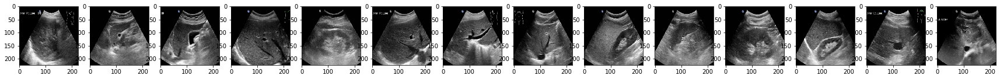

[4028, 22369, 7464, 12953, 10487, 14553, 5749, 2160, 1955, 22282, 5687, 1735, 20517, 4507]
14 random images for code 4


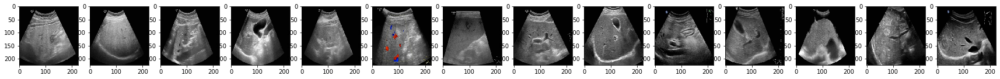

[6851, 7748, 22130, 9030, 22176, 17807, 19857, 11264, 7978, 2678, 4438, 309, 6454, 18464]
14 random images for code 5


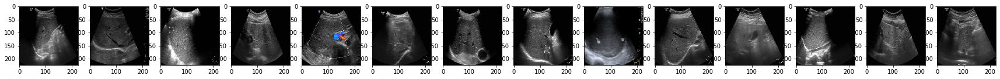

[2070, 10510, 16578, 18724, 3385, 7718, 20805, 2576, 8471, 7316, 10850, 8847, 3620, 3145]
14 random images for code 6


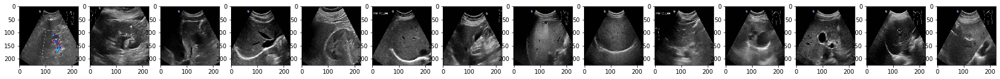

[794, 21304, 445, 12041, 628, 2515, 11291, 21467, 21780, 1414, 18285, 19322, 5166, 16336]
14 random images for code 7


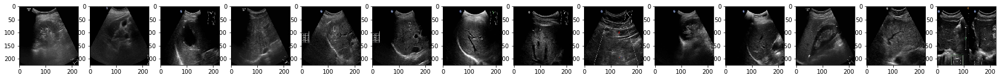

[698, 4729, 5734, 11391, 2655, 6728, 13422, 115, 7293, 8973, 13602, 1144, 6356, 12888]
14 random images for code 8


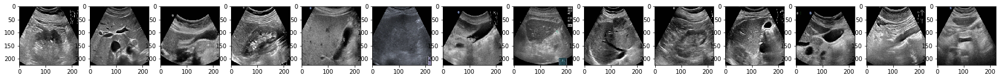

[19661, 6623, 19333, 10950, 10339, 345, 15523, 9806, 6610, 17758, 9905, 22996, 20528, 14491]
14 random images for code 9


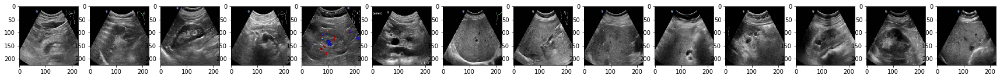

In [40]:
print("K=10")
K_vgg16_pca_10 = create_train_kmeans(vgg16_output_pca, number_of_clusters=10)
k_vgg16_pred_pca_10 = K_vgg16_pca_10.predict(vgg16_output_pca)
show_random_images(X_train, k_vgg16_pred_pca_10, number_of_images_to_show=14)

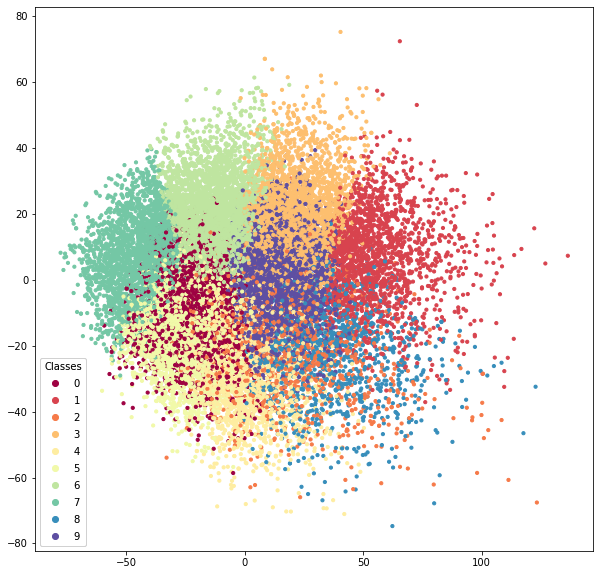

In [41]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_10, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{0: 2342, 6: 3715, 7: 2430, 3: 2837, 5: 2562, 9: 3209, 8: 1174, 2: 1423, 4: 1723, 1: 1764}


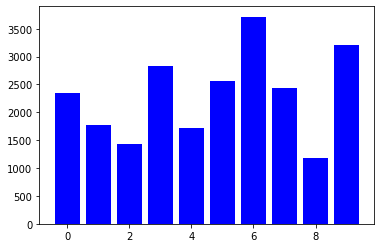

In [42]:
count_cluster = dict()

for i in k_vgg16_pred_pca_10:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster)  
plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()

## K=15

K=15
Training took 14.562060356140137 seconds
[9337, 12172, 21186, 11810, 19163, 21609, 19908, 7707, 14413, 9355, 5694, 11163, 2796, 5310]
14 random images for code 0


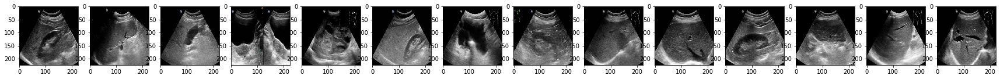

[5558, 7748, 16962, 4597, 4816, 6587, 11492, 13530, 502, 4291, 8804, 16600, 23012, 12037]
14 random images for code 1


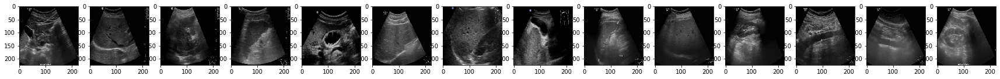

[15234, 11735, 5274, 1896, 14408, 18776, 6289, 13195, 13761, 10678, 4283, 3227, 8264, 4138]
14 random images for code 2


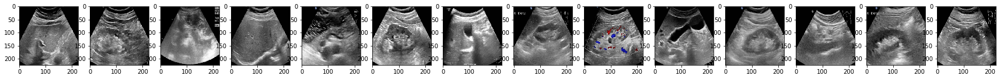

[4631, 4513, 22095, 12164, 19706, 12046, 2861, 17830, 3105, 4363, 22788, 18423, 232, 15954]
14 random images for code 3


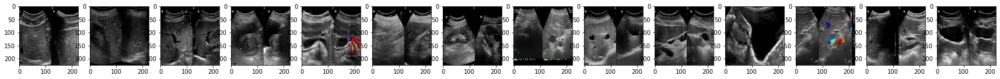

[21103, 14794, 22761, 11554, 20300, 18425, 19740, 12493, 4720, 2311, 11215, 22519, 14126, 16753]
14 random images for code 4


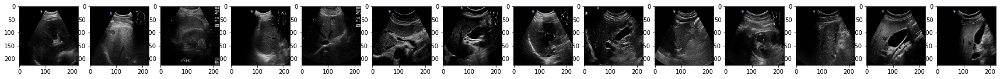

[13808, 14201, 13867, 21679, 17666, 5082, 7069, 19274, 11898, 8209, 13528, 8617, 6697, 5820]
14 random images for code 5


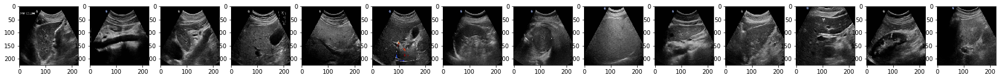

[12869, 21497, 23044, 13211, 15199, 13507, 5358, 14446, 2526, 13755, 4465, 19269, 20652, 17174]
14 random images for code 6


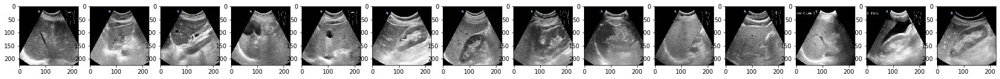

[7758, 23171, 6433, 12874, 6150, 11120, 4582, 6916, 10926, 18852, 14995, 18590, 4128, 13686]
14 random images for code 7


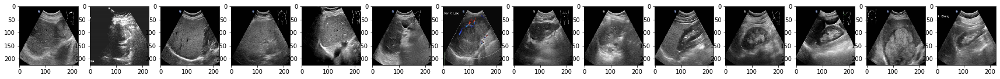

[2888, 9576, 19566, 17857, 18517, 19912, 3184, 9706, 20369, 8546, 10756, 10611, 9531, 10570]
14 random images for code 8


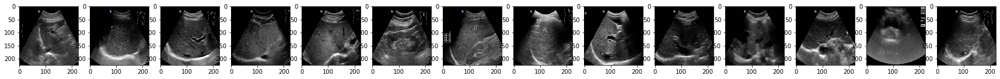

[5444, 5862, 15351, 13109, 11472, 6334, 3689, 13634, 10412, 11006, 10908, 5456, 15406, 19450]
14 random images for code 9


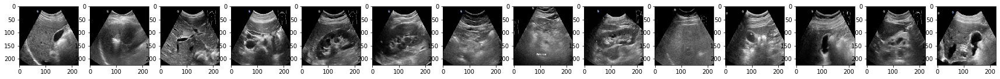

[15656, 18210, 11600, 18483, 87, 5612, 20901, 21240, 13896, 1842, 608, 15447, 8670, 7326]
14 random images for code 10


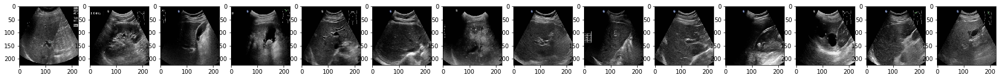

[19290, 16839, 14377, 5546, 16941, 13949, 4249, 1217, 14402, 8614, 9414, 6269, 8632, 11062]
14 random images for code 11


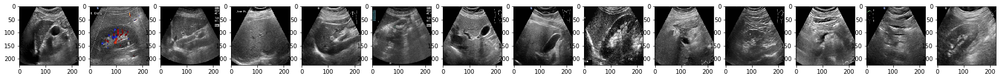

[17878, 14340, 21669, 5118, 9773, 21211, 15169, 10160, 15719, 22337, 5570, 9081, 12444, 22686]
14 random images for code 12


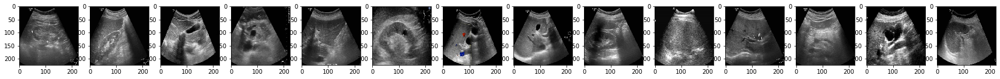

[10573, 3710, 7129, 1448, 20228, 20474, 5561, 9486, 7173, 573, 11164, 2723, 17628, 1139]
14 random images for code 13


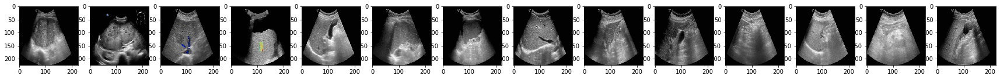

[16854, 827, 17151, 8979, 22389, 15105, 8353, 3343, 9807, 11058, 2854, 22571, 5754, 18796]
14 random images for code 14


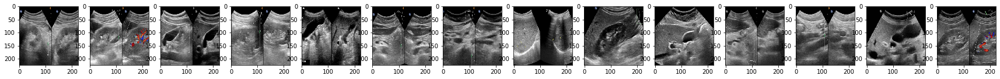

In [43]:
print("K=15")
K_vgg16_pca_15 = create_train_kmeans(vgg16_output_pca, number_of_clusters=15)
k_vgg16_pred_pca_15 = K_vgg16_pca_15.predict(vgg16_output_pca)
show_random_images(X_train, k_vgg16_pred_pca_15, number_of_images_to_show=14)

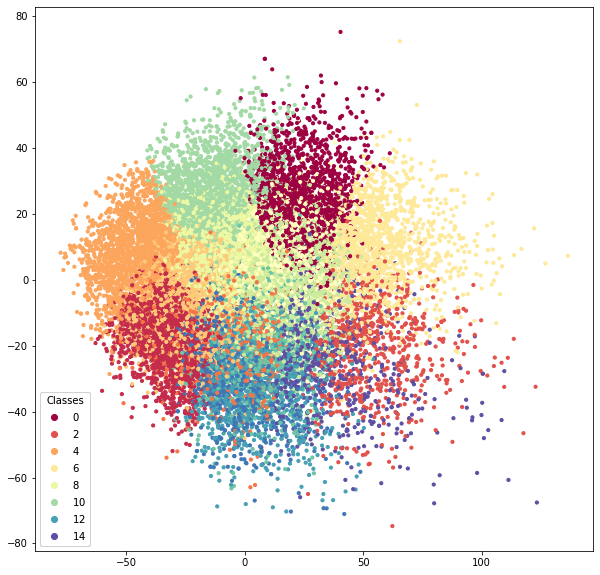

In [44]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_15, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{5: 2151, 10: 2164, 4: 2069, 0: 1915, 1: 1915, 12: 1126, 8: 2313, 14: 685, 2: 763, 11: 958, 9: 2050, 6: 1433, 3: 907, 7: 1647, 13: 1083}


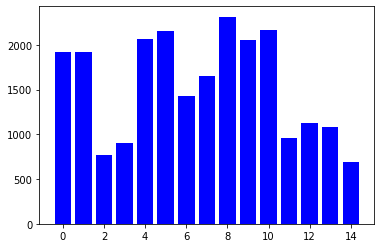

In [45]:
count_cluster = dict()

for i in k_vgg16_pred_pca_15:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster) 
plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()